In [1]:
from skimage import feature
import numpy as np
from skimage.feature import hog
from matplotlib import pyplot as plt
import cv2
import cv2 as cv
from sklearn.svm import SVC
from imutils import paths
from skimage.feature import canny
from skimage.feature import *
from sklearn.model_selection import train_test_split
import os


import numpy as np
import matplotlib.pyplot as plt
import cv2

from skimage import data, color
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.feature import canny
from skimage.draw import circle_perimeter
from skimage.util import img_as_ubyte, crop

### Data load

In [2]:
def dataload(resize=False, dim=(800, 800)):
    data_image = []

    for imagePath in paths.list_images('monets_2'):
        image = cv2.imread(imagePath)
        x = image.shape[0]
        y = image.shape[1]
        if resize:
            image = cv2.resize(image, dim)

        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        # Load picture and detect edges
        image = img_as_ubyte(gray)
        image_clear = img_as_ubyte(gray)
        edges = canny(image, sigma=3, low_threshold=40, high_threshold=60)
        



        # Detect radii
        hough_radii = np.arange(128, 130, 2)
        hough_res = hough_circle(edges, hough_radii)

        # Select the circles
        accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,
                                                   total_num_peaks=1)
        
        print(imagePath)
        print(cx, cy)
        print(radii)
            
        
#         plt.imshow(edges)
#         plt.show()

        # Draw them
        fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))
        image = color.gray2rgb(image)
        for center_y, center_x, radius in zip(cy, cx, radii):
            circy, circx = circle_perimeter(center_y, center_x, radius,
                                            shape=image.shape)
            image[circy, circx] = (220, 20, 20)


        cropped = image[int(cy-radii*1.5):int(cy+radii*1.5),int(cx-radii*1.5):int(cx+radii*1.5)]
        if int(cy-radii*1.5) < 0 or int(cy+radii*1.5) < 0 or int(cx-radii*1.5) < 0 or int(cx+radii*1.5)< 0:
            cropped_clear = image_clear[int(cy-radii):int(cy+radii),int(cx-radii):int(cx+radii)]
        else:            
            cropped_clear = image_clear[int(cy-radii*1.5):int(cy+radii*1.5),int(cx-radii*1.5):int(cx+radii*1.5)]
            
            
        if int(cy-radii) < 0 or int(cy+radii) < 0 or int(cx-radii) < 0 or int(cx+radii)< 0:
            print(imagePath)
            break



        image_rec = cv2.rectangle(image, (int(cx-radii), int(cy-radii)), (int(cx+radii), int(cy+radii)), (255, 0, 0))
#         plt.imshow(image)
#         plt.show()
#         plt.imshow(cropped_clear)
#         plt.show()
            
        
        data_image.append(cropped_clear)
        
    return data_image

In [3]:
files_orels = os.listdir(path="monets_2/orels")
len_orels = len(files_orels) - 1

files_reshkas = os.listdir(path="monets_2/reshkas")
len_reshkas = len(files_reshkas) - 1

print(len_orels)
print(len_reshkas)

203
225


monets_2\orels\-5CiehOxVjw.jpg
[419] [519]
[128]
monets_2\orels\-Vn1d5HtHKk.jpg
[383] [520]
[128]
monets_2\orels\4aXcRHvhCkQ.jpg
[401] [554]
[128]
monets_2\orels\51Ve-eonaew.jpg
[385] [538]
[128]
monets_2\orels\66Mpe5oWOqA.jpg
[407] [553]
[128]
monets_2\orels\6__rVYfYrkw.jpg
[389] [528]
[128]
monets_2\orels\7O4sb4TtAf8.jpg
[405] [526]
[128]
monets_2\orels\8mz98kW-dEw.jpg
[413] [525]
[128]
monets_2\orels\9yKZOjHNf2E.jpg
[373] [478]
[128]
monets_2\orels\A1IQH4Z-fLg.jpg
[439] [804]
[128]
monets_2\orels\aIB0owYOFIE.jpg
[406] [491]
[128]
monets_2\orels\anb52xFS9mI.jpg
[422] [535]
[128]
monets_2\orels\B-JBvn0NFqw.jpg
[436] [489]
[128]
monets_2\orels\b0QdVfF0Q14.jpg
[380] [518]
[128]
monets_2\orels\bCZuA-6Tkyg.jpg
[451] [534]
[128]
monets_2\orels\c66fVTGC0oQ.jpg
[397] [575]
[128]
monets_2\orels\CiI7F0GLFIY.jpg
[381] [504]
[128]
monets_2\orels\DBKV1MpqFVg.jpg
[408] [550]
[128]
monets_2\orels\ddUxElvDTI8.jpg
[442] [474]
[128]
monets_2\orels\DTmzz4ngxQo.jpg
[413] [543]
[128]
monets_2\orels\dY5dm

C:\Users\kiril\AppData\Local\Temp/ipykernel_12592/3287848476.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))


monets_2\orels\Er2-Mx2985E.jpg
[446] [565]
[128]
monets_2\orels\H0hqokrkaMY.jpg
[413] [546]
[128]
monets_2\orels\hraXLXF-urc.jpg
[399] [552]
[128]
monets_2\orels\ieKPb--8ofw.jpg
[413] [518]
[128]
monets_2\orels\iGoaj4Lm6E0.jpg
[401] [536]
[128]
monets_2\orels\ILz2fmieUHI.jpg
[436] [825]
[128]
monets_2\orels\IMG-041cc9ec67914339643071c4b7c22aed-V.jpg
[374] [880]
[128]
monets_2\orels\IMG-12abc39437919e6beaae1bfb69fcf37c-V.jpg
[384] [819]
[128]
monets_2\orels\IMG-19b328667773067f6e3438802856e713-V.jpg
[355] [838]
[128]
monets_2\orels\IMG-1a03c0d1bcd7c7efac499a7b021ab6b2-V.jpg
[396] [1022]
[128]
monets_2\orels\IMG-2d172959ec8190827a4f5ca9dc54be42-V.jpg
[294] [1028]
[128]
monets_2\orels\IMG-3b4ffe6daa82d921cf34d178d273d543-V.jpg
[309] [1048]
[128]
monets_2\orels\IMG-474b701ac8caa35a11e2d494224d89d8-V.jpg
[311] [807]
[128]
monets_2\orels\IMG-4dd87cc4ed475e35852ab0df6c66f6f7-V.jpg
[466] [629]
[128]
monets_2\orels\IMG-4e933673208a7526b18dfc4cc77b5e26-V.jpg
[412] [935]
[128]
monets_2\orels\IMG-

monets_2\orels\IMG_20220105_120532.jpg
[514] [577]
[128]
monets_2\orels\IMG_20220105_120536.jpg
[529] [517]
[128]
monets_2\orels\IMG_20220105_120543.jpg
[497] [681]
[128]
monets_2\orels\IMG_20220105_120548.jpg
[517] [636]
[128]
monets_2\orels\jUBAbgcTNww.jpg
[397] [515]
[128]
monets_2\orels\JUKL0YlfL_k.jpg
[400] [552]
[128]
monets_2\orels\JVcZE3Wi56M.jpg
[418] [689]
[128]
monets_2\orels\JvKbz7-O-oQ.jpg
[342] [528]
[128]
monets_2\orels\M2VCYSBCAR0.jpg
[406] [459]
[128]
monets_2\orels\mrsd_hgdYug.jpg
[449] [543]
[128]
monets_2\orels\MZBC_0CXdJA.jpg
[391] [589]
[128]
monets_2\orels\NAXVzV0sQ6o.jpg
[395] [563]
[128]
monets_2\orels\NGOpA7SRVoU.jpg
[378] [516]
[128]
monets_2\orels\O7ZijOAR-C8.jpg
[424] [555]
[128]
monets_2\orels\OpiPWOAJC1M.jpg
[405] [552]
[128]
monets_2\orels\Pj8Dhw2f488.jpg
[434] [519]
[128]
monets_2\orels\qABak41YCeQ.jpg
[380] [561]
[128]
monets_2\orels\qdO2Vtk8Lfk.jpg
[411] [534]
[128]
monets_2\orels\RJd-_7rhx98.jpg
[377] [547]
[128]
monets_2\orels\S8C8tObLmzk.jpg
[373] 

monets_2\reshkas\IMG_20220105_003551.jpg
[324] [753]
[128]
monets_2\reshkas\IMG_20220105_003557.jpg
[294] [760]
[128]
monets_2\reshkas\IMG_20220105_003601.jpg
[350] [810]
[128]
monets_2\reshkas\IMG_20220105_003605.jpg
[328] [779]
[128]
monets_2\reshkas\IMG_20220105_003647.jpg
[129] [129]
[128]
monets_2\reshkas\IMG_20220105_022504.jpg
[552] [471]
[128]
monets_2\reshkas\IMG_20220105_023705.jpg
[484] [558]
[128]
monets_2\reshkas\IMG_20220105_023708.jpg
[515] [528]
[128]
monets_2\reshkas\IMG_20220105_023710.jpg
[516] [562]
[128]
monets_2\reshkas\IMG_20220105_023713.jpg
[484] [586]
[128]
monets_2\reshkas\IMG_20220105_023715.jpg
[452] [575]
[128]
monets_2\reshkas\IMG_20220105_023718.jpg
[481] [581]
[128]
monets_2\reshkas\IMG_20220105_023720.jpg
[474] [573]
[128]
monets_2\reshkas\IMG_20220105_023722.jpg
[492] [555]
[128]
monets_2\reshkas\IMG_20220105_023725.jpg
[535] [593]
[128]
monets_2\reshkas\IMG_20220105_023727.jpg
[558] [587]
[128]
monets_2\reshkas\IMG_20220105_023755.jpg
[491] [650]
[12

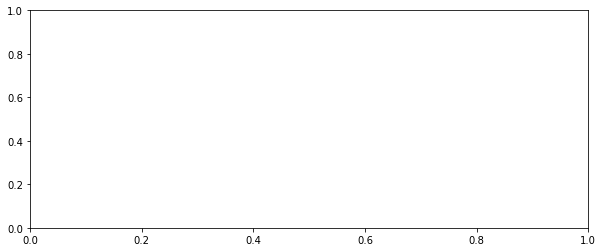

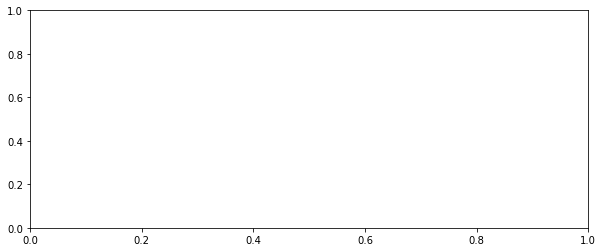

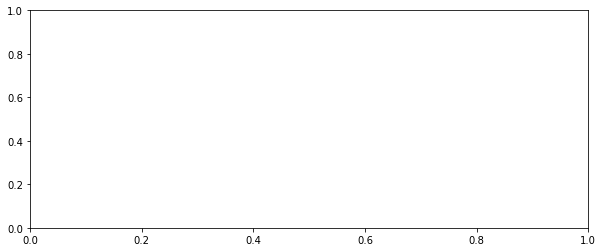

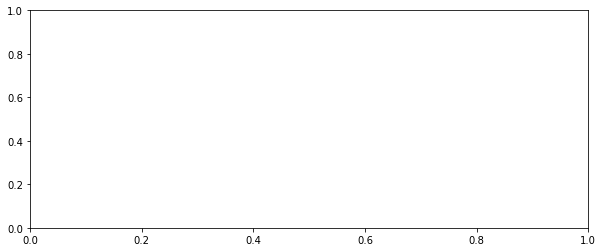

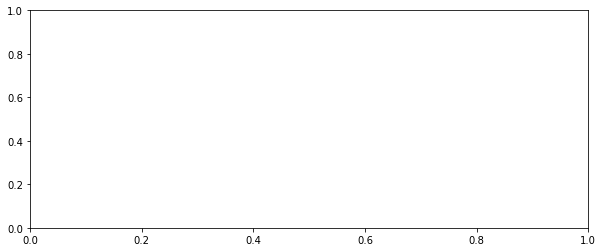

...

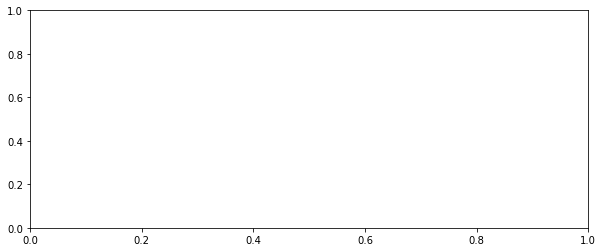

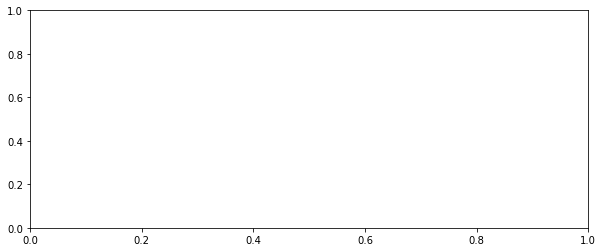

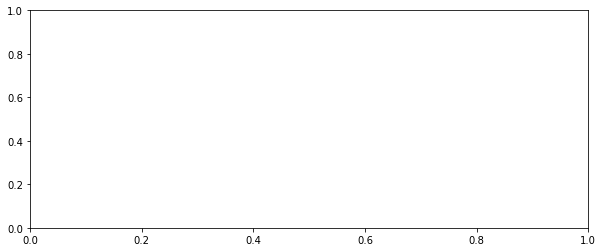

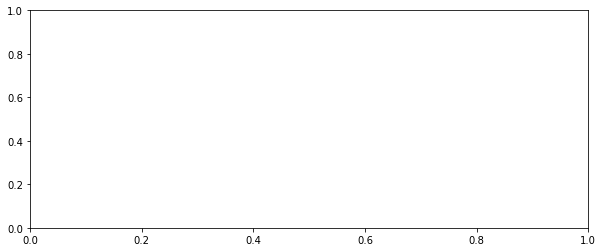

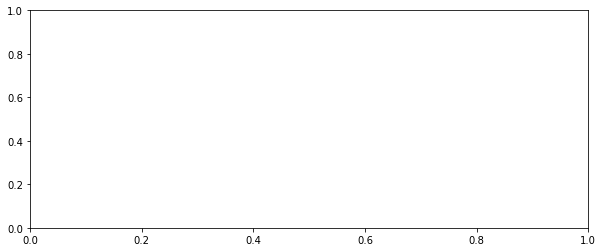

In [4]:
data_images = dataload()
print(len(data_images))
labels = [1 for _ in range(len_orels)] + [0 for i in range(len_reshkas)]
print(len(labels))
X_train, X_test, y_train, y_test = train_test_split(data_images, labels, test_size=0.3, random_state=42, shuffle=True)




### feature extractor

In [15]:
def feature_extractor(imgs):
    features = []
    hog_images = []
    features_max = []
    for image in imgs:    
        feature, hog_image = hog(image, orientations=40, pixels_per_cell=(17, 17), cells_per_block=(1, 1), visualize=True)
        print(len(feature))
        if len(feature) < 19360:
            zero_lst = np.zeros(19360 - len(feature))
            feature = np.concatenate((feature, zero_lst), axis=None)            
#         plt.imshow(hog_image)
#         plt.show()     
        features.append(feature)
    
#     max_length = max(len(x) for x in features)
#     print(max_length)
#     for feature in features:
#         if len(feature) < max_length:
#             zero_lst = np.zeros(max_length-len(feature))
#             feature = np.concatenate((feature, zero_lst), axis=None)      
 
       
#         features_max.append(feature)    
    return features

In [16]:
train_features = feature_extractor(X_train)
test_features = feature_extractor(X_test)

19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
9000
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360
19360

In [17]:
from xgboost import XGBClassifier
from sklearn.svm import LinearSVC

# model = XGBClassifier()
# model.fit(np.array(train_features), np.array(y_train))
model = LinearSVC(C=1.0, random_state=42)
model.fit(np.array(train_features), np.array(y_train))

LinearSVC(random_state=42)

0


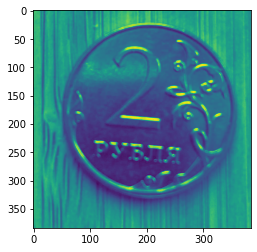

0


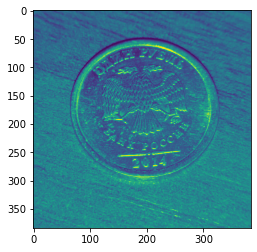

1


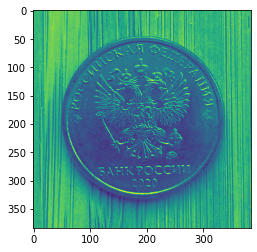

1


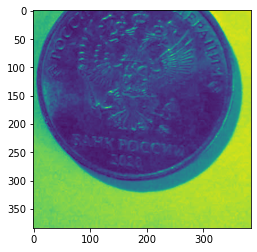

0


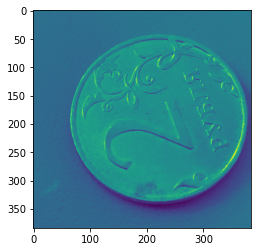

0


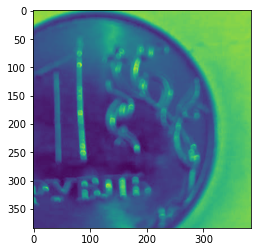

1


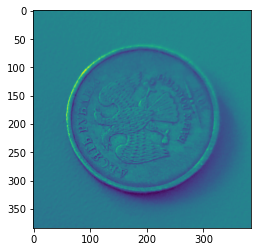

1


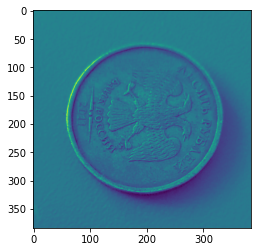

1


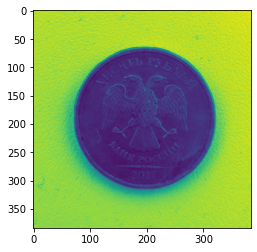

1


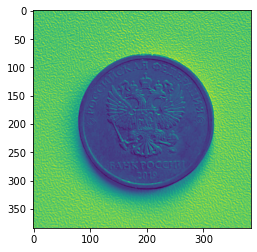

0


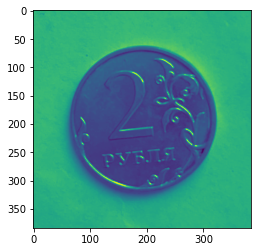

1


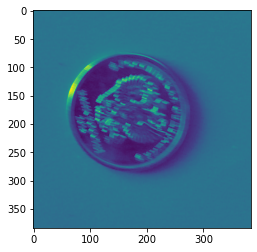

0


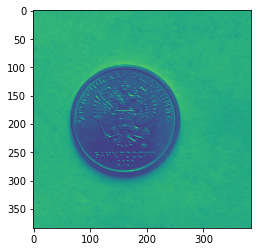

0


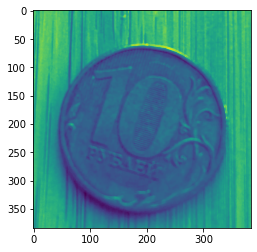

0


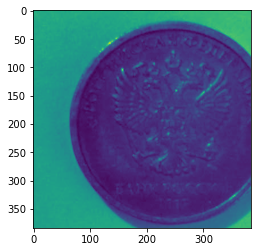

1


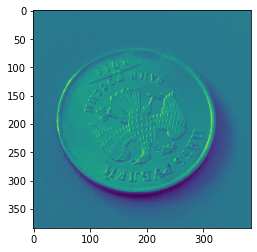

0


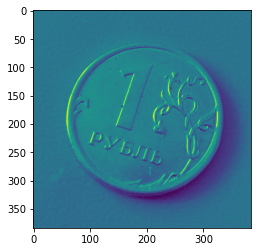

1


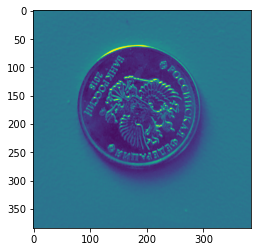

1


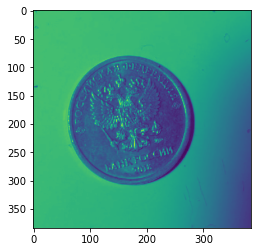

0


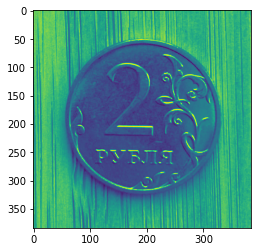

0


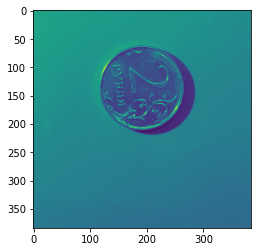

0


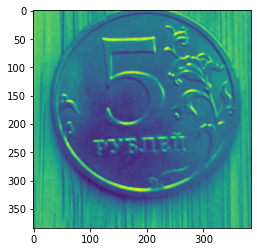

0


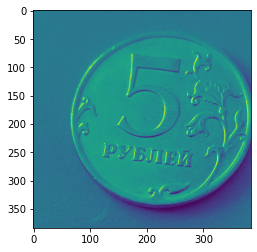

1


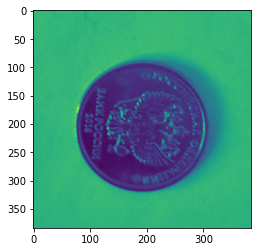

1


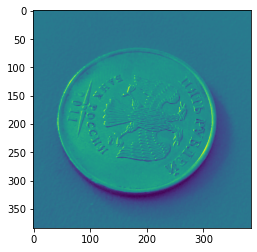

1


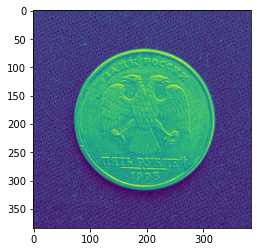

1


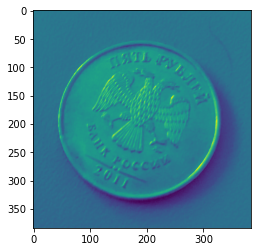

0


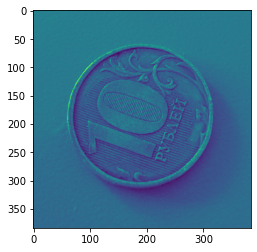

0


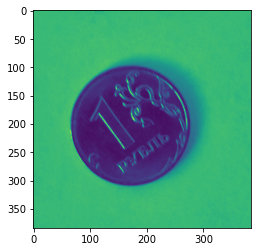

0


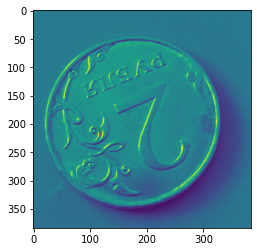

1


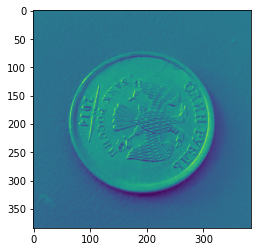

0


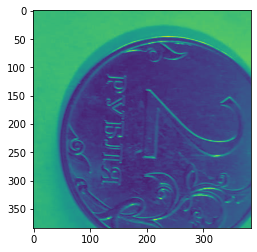

1


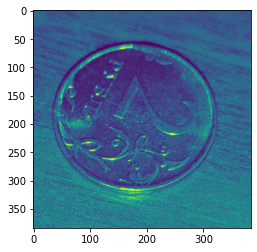

1


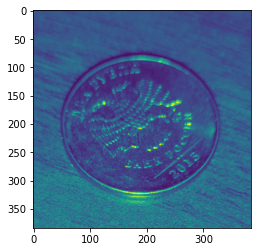

0


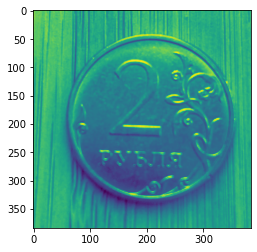

1


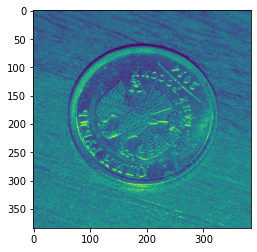

0


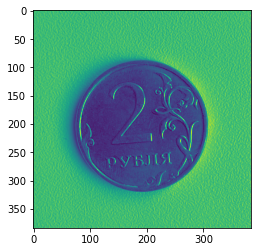

0


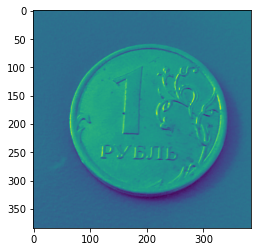

0


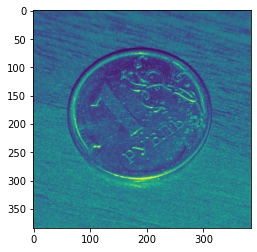

0


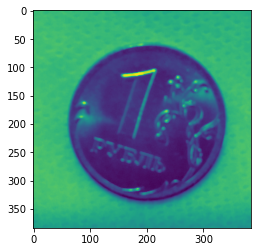

0


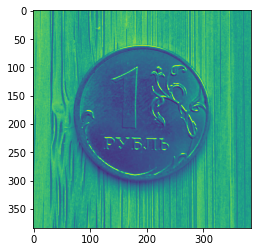

1


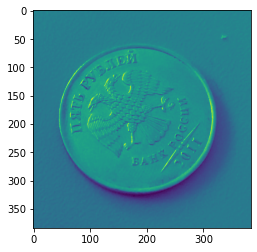

1


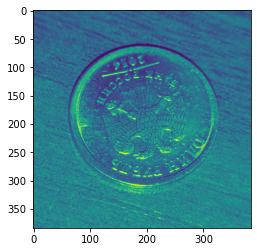

1


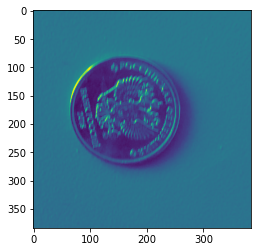

0


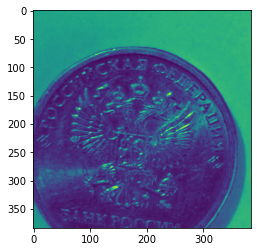

1


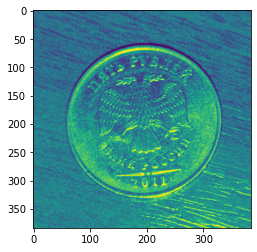

0


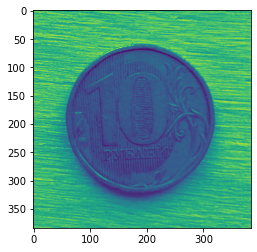

1


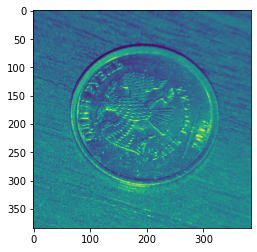

0


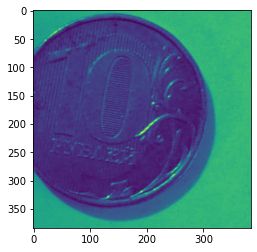

0


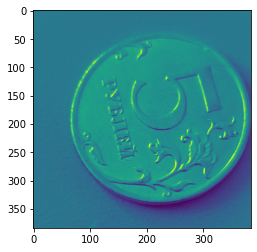

1


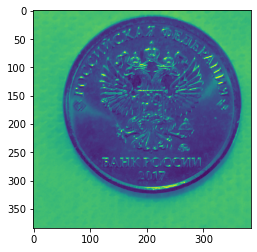

0


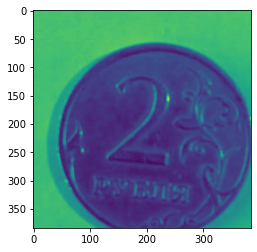

1


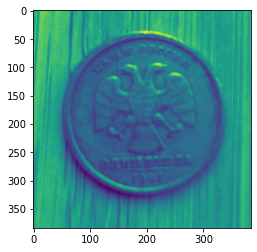

1


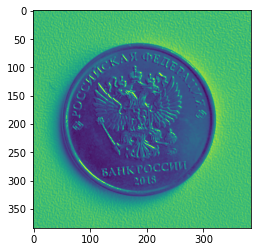

1


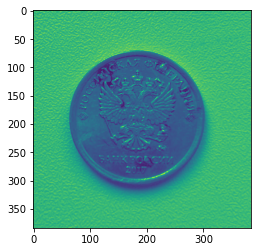

0


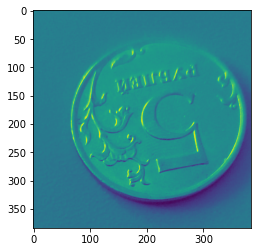

0


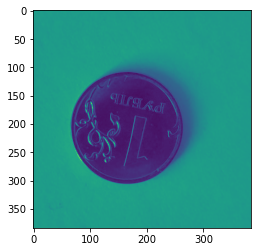

1


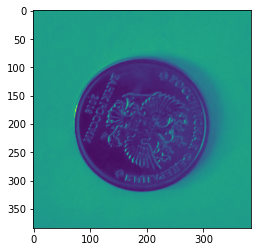

1


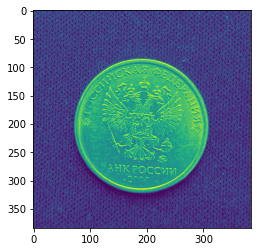

1


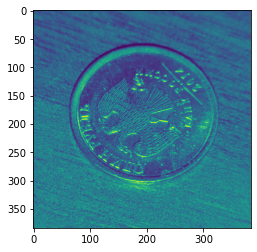

1


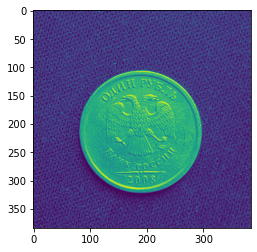

0


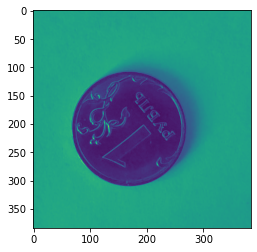

1


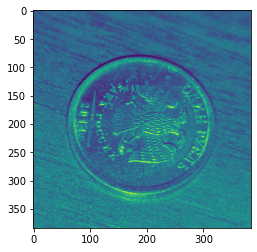

1


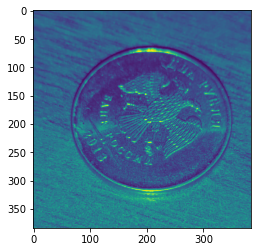

0


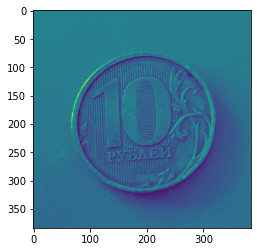

1


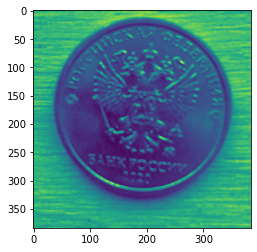

0


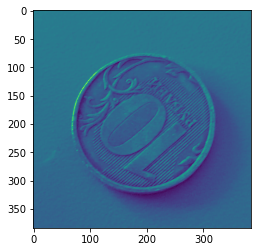

1


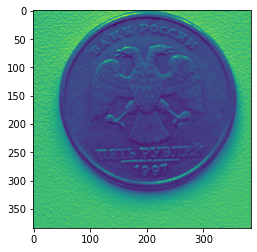

1


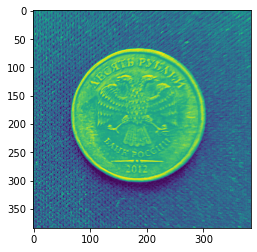

0


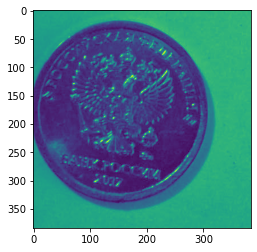

1


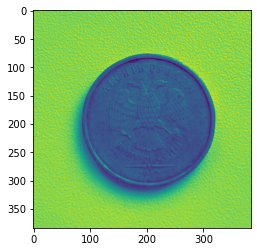

0


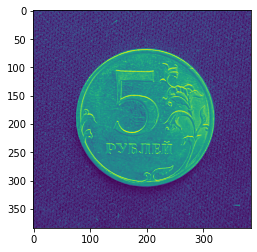

1


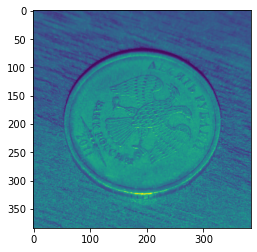

0


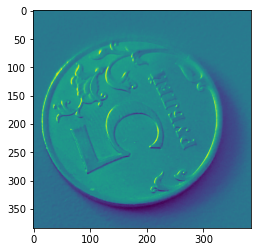

0


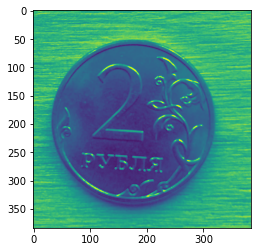

0


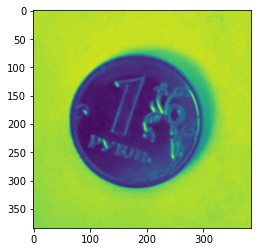

1


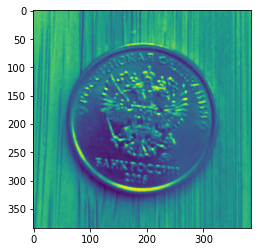

0


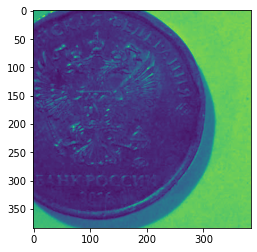

0


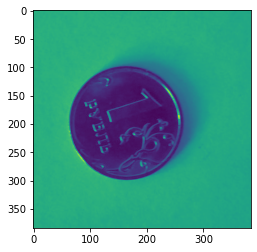

1


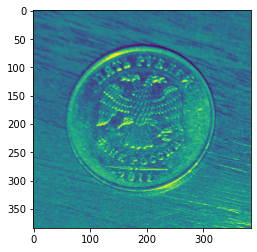

1


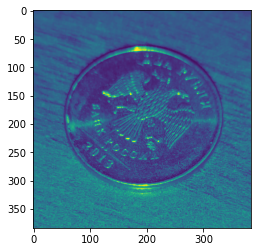

0


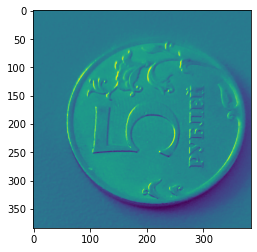

1


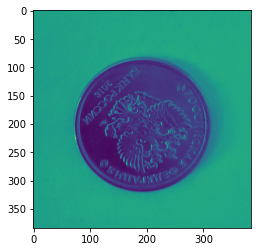

1


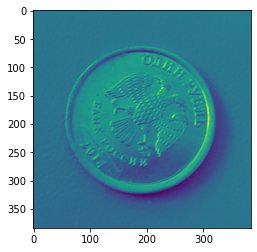

1


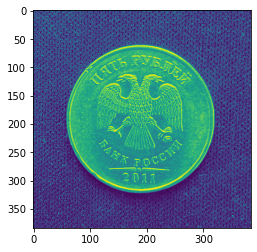

0


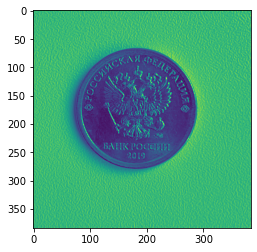

1


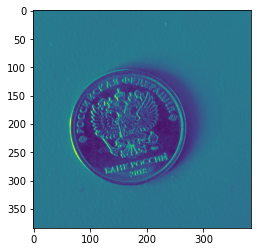

1


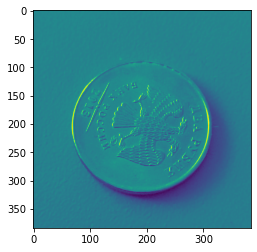

0


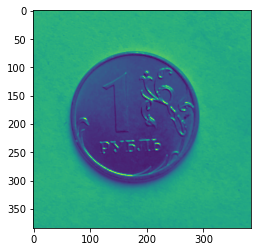

1


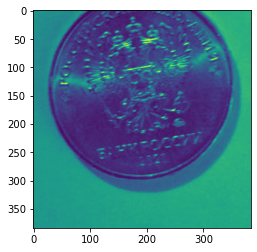

1


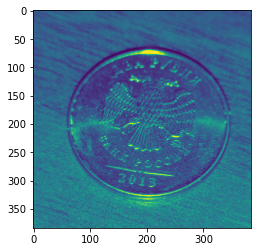

0


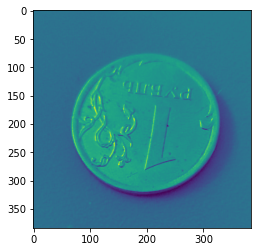

0


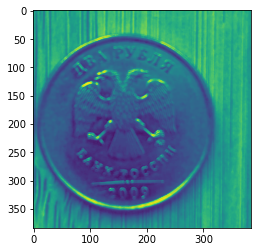

0


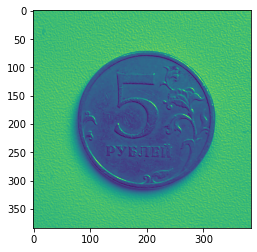

0


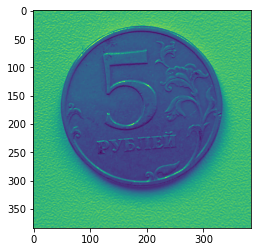

0


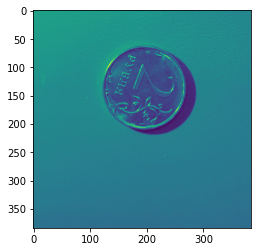

0


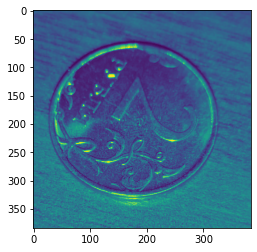

0


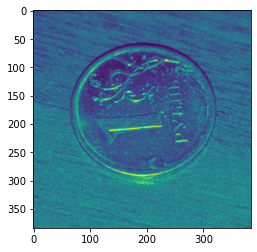

1


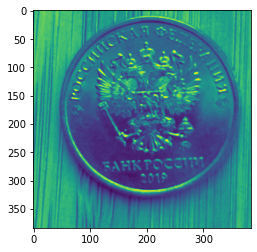

1


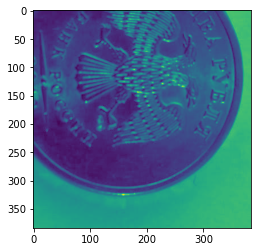

0


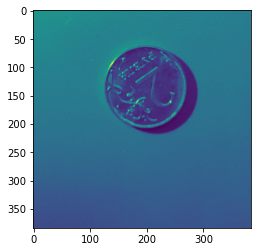

0


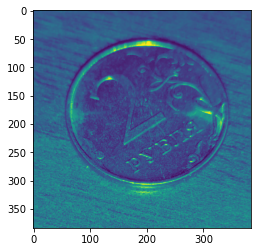

0


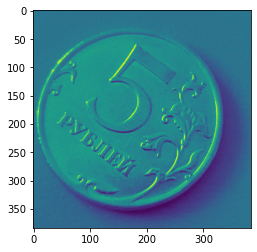

0


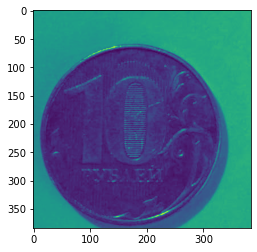

1


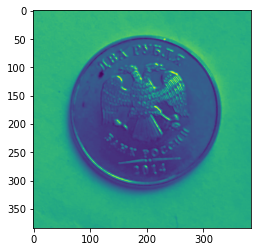

0


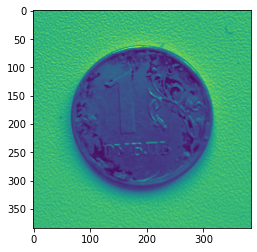

1


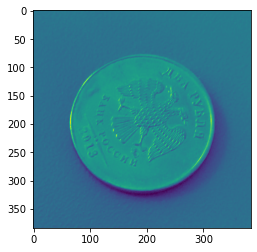

0


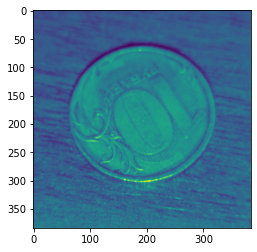

1


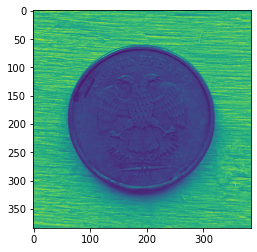

1


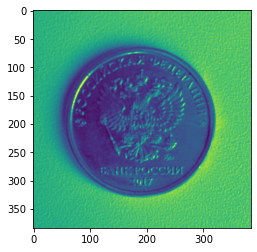

0


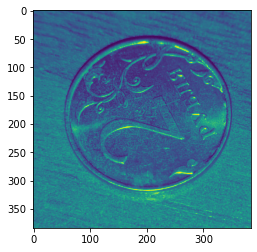

1


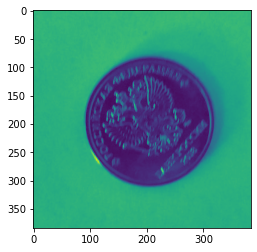

0


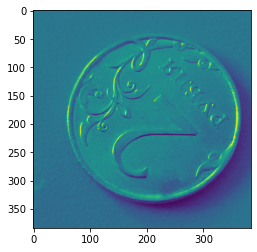

0


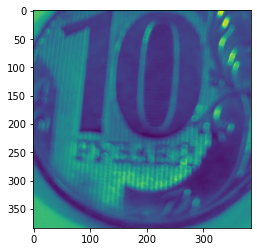

1


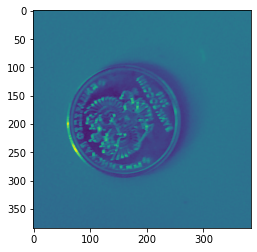

1


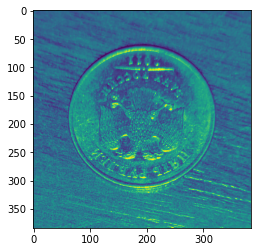

0


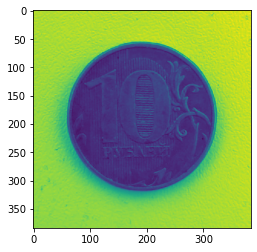

1


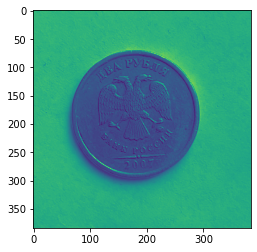

0


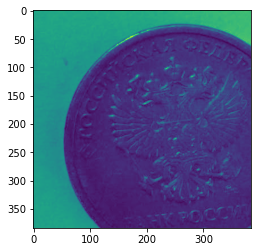

0


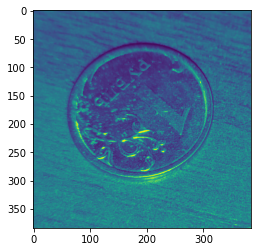

0


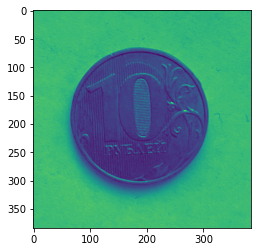

0


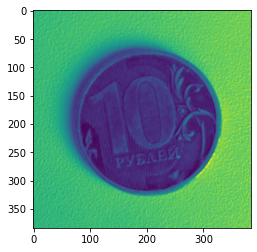

0


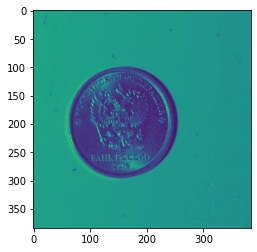

1


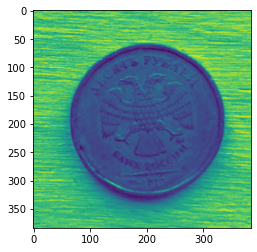

0


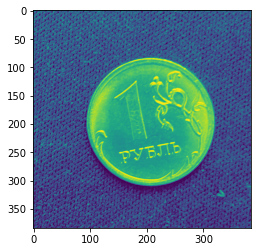

0


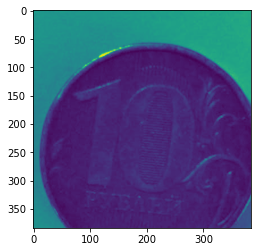

1


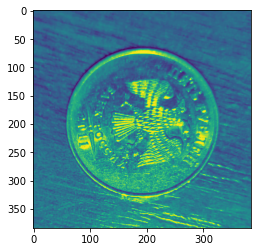

0


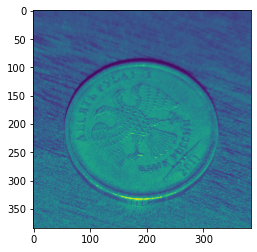

0


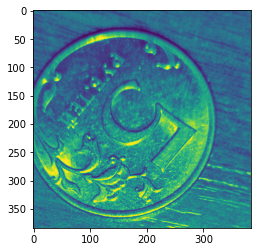

In [18]:
y_preds = []
for i in range(len(X_test)):
#     gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    prediction = model.predict(test_features[i].reshape(1, -1))[0]
    y_preds.append(prediction)
    print(prediction)
    plt.imshow(X_test[i])
    plt.show()

In [19]:
from sklearn.metrics import accuracy_score as acc
acc(y_test, y_preds)

0.9069767441860465

### Подбор параметров для функции hog (orientations / pixels_per_cell / accuracy):
### 20 15x15 85%
### 40 15x15 86.8%
### 40 17x17 89.1%
### 40 19x19 83.7%
### 40 18x18 88.3%
### 50 17x17 89.1
### 1 17x17 40%
### 10 17x17 82%
### 20 17x17 86%
### 30 17x17 87%